# Imports

In [1]:
import logging, warnings; logging.getLogger().setLevel(logging.ERROR);
warnings.filterwarnings("ignore")

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import re
from pathlib import Path 

import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
import matplotlib.font_manager
import matplotlib.lines as lines


pd.set_option('display.max_rows', 200)

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=12)

sc.settings.n_jobs=-1
sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.figdir = '../../1_outputs/0_figures'
sc.settings.verbosity = 1 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

In [2]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [3]:
# preset color palettes and color maps
user_defined_palette =  [ '#F6222E', '#16FF32', '#3283FE', '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', 
                          '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']

user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [4]:
pwd

'/Users/mkaur/projects/7_dc/1_pyzone/0_notebooks/0_scRNA'

In [5]:
file_outputs = '../../1_outputs/' 
h5ad = '../../1_outputs/1_h5ad/'

In [6]:
adata = sc.read_h5ad(h5ad + '8_myeloid.h5ad')
adata

AnnData object with n_obs × n_vars = 378 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type', 'cell_type_subset'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'di

## Rerun HVG, PCA, Harmony, UMAP

In [7]:
sc.pp.highly_variable_genes(adata, n_top_genes=1000, n_bins=20, flavor='seurat',  inplace=True)

In [8]:
sc.tl.pca(adata, n_comps=50, svd_solver='arpack', random_state=42, use_highly_variable=False) #change use_highly_variable == True if you ran the block above

<function matplotlib.pyplot.show(close=None, block=None)>

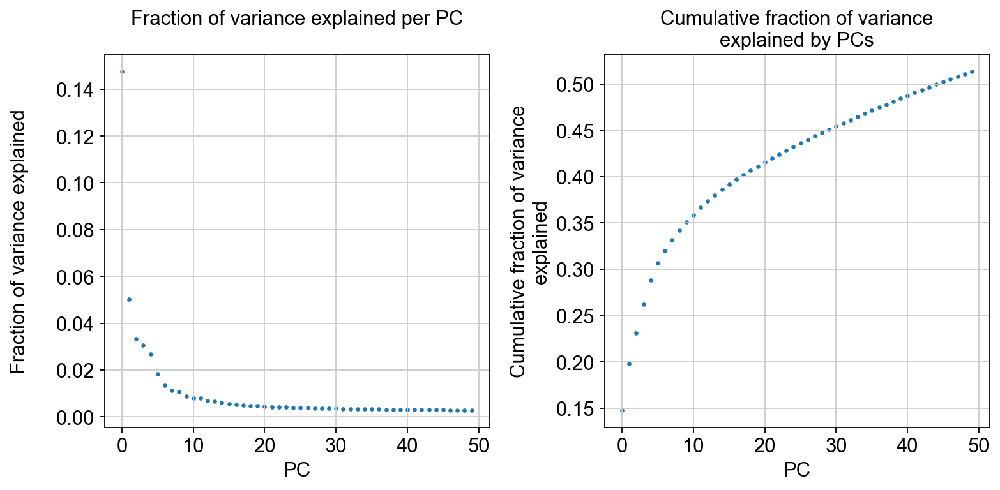

In [9]:
observe_variance(adata)

In [10]:
sc.tl.pca(adata, n_comps=6, svd_solver='arpack', random_state=42, use_highly_variable=False) #change use_highly_variable == True if you ran the block above

#### Harmony integrate the data if there are large batch effects

In [12]:
sce.pp.harmony_integrate(adata, ['sample'], max_iter_harmony = 20) # Usually you want to run based on replicates but you can also run based on other parameters

2026-07-20 20:20:15,092 - harmonypy - INFO - Iteration 1 of 20
2026-07-20 20:20:15,113 - harmonypy - INFO - Iteration 2 of 20
2026-07-20 20:20:15,133 - harmonypy - INFO - Iteration 3 of 20
2026-07-20 20:20:15,151 - harmonypy - INFO - Iteration 4 of 20
2026-07-20 20:20:15,167 - harmonypy - INFO - Iteration 5 of 20
2026-07-20 20:20:15,183 - harmonypy - INFO - Iteration 6 of 20
2026-07-20 20:20:15,200 - harmonypy - INFO - Iteration 7 of 20
2026-07-20 20:20:15,217 - harmonypy - INFO - Converged after 7 iterations


If you batch corrected, make sure to use the use_rep = 'X_pca_harmony' paremeter below

In [13]:
sc.pp.neighbors(adata, n_neighbors=25, random_state=42, use_rep='X_pca_harmony')  # Change use_rep == X_pca_harmony if you ran the block above

In [14]:
sc.tl.umap(adata, random_state=42)

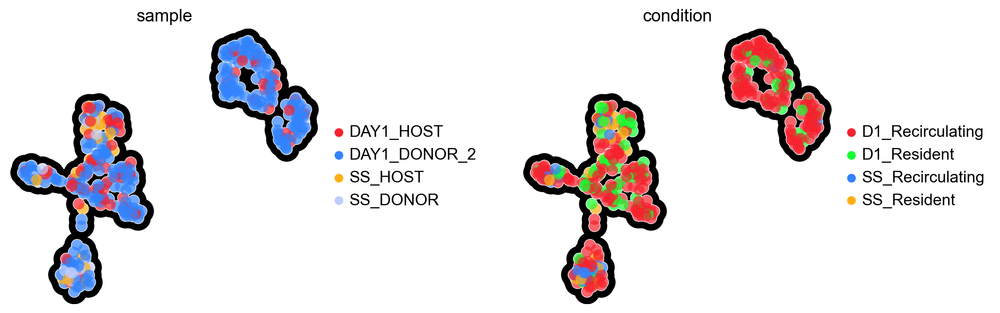

In [15]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['sample', 'condition'],   
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

# Annotations

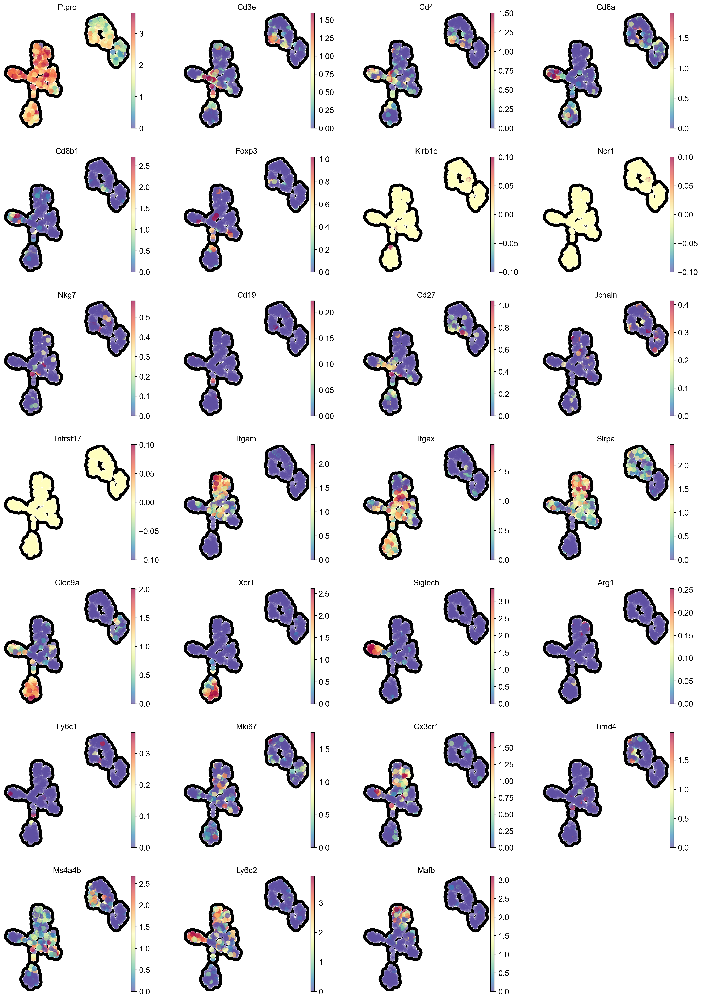

In [16]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'Ptprc',

        #T cells: 
        'Cd3e', 'Cd4', 'Cd8a', 'Cd8b1', 'Foxp3', 

        #NK cells
        'Klrb1c', 'Ncr1', 'Nkg7',
        
        #B Cells:
        'Cd19', 'Cd27', 'Jchain',

        #Plasma Cells: 
        'Tnfrsf17',

        #Myeloid/ DCS
        'Itgam', 'Itgax', 'Sirpa', 'Clec9a', 'Xcr1', 'Siglech', 'Arg1', 'Ly6c1',

        'Mki67',

        'Cx3cr1', 'Timd4', 'Ms4a4b', 'Ly6c2', 'Mafb'
        
        
          ],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    vmax='p99',
    frameon=False,
    add_outline=True,
    sort_order = False,
)

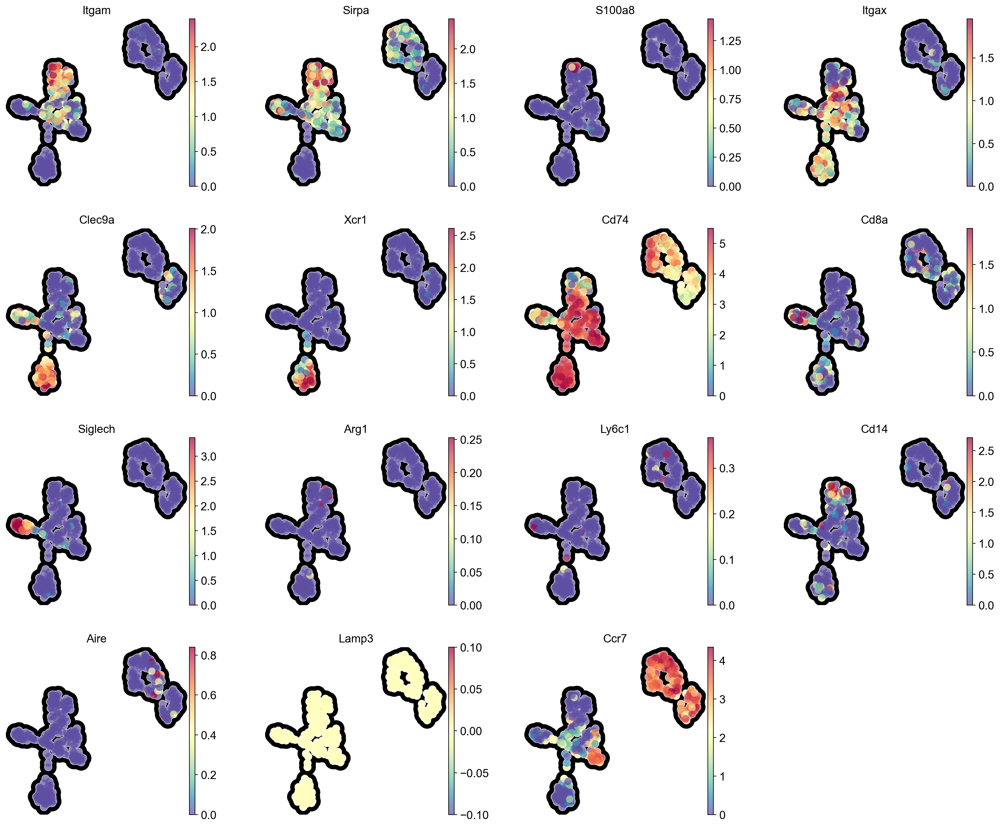

In [17]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'Itgam', 'Sirpa', 'S100a8', #cDC2
        
        'Itgax', #cDC
        
        'Clec9a', 'Xcr1', 'Cd74', #cDC1

        'Cd8a', #CD8α Resident
        
        'Siglech', #pDC
        
        'Arg1', 'Ly6c1', #MDSCs

        'Cd14', 'Aire', 'Lamp3', 'Ccr7'
        
          ],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    vmax='p99',
    frameon=False,
    add_outline=True,
    sort_order = False,
)

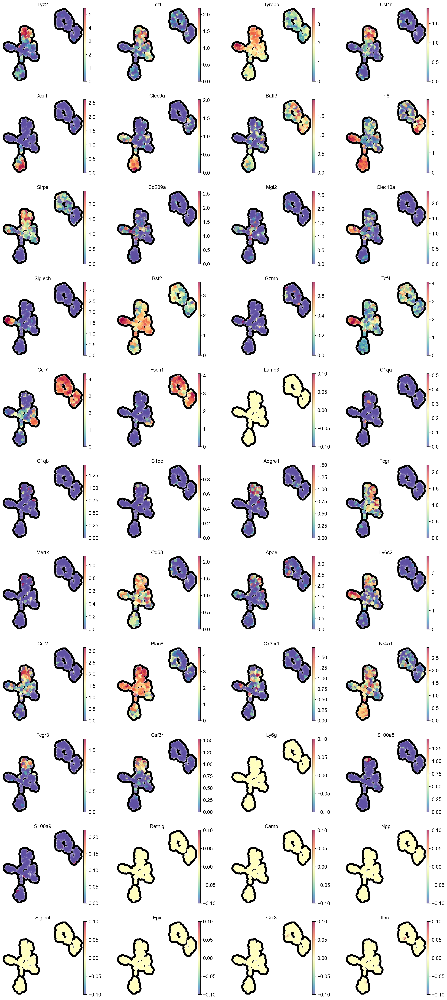

In [19]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        # General myeloid
    "Lyz2", "Lst1", "Tyrobp", "Csf1r",

    # cDC1
    "Xcr1", "Clec9a", "Batf3", "Irf8",

    # cDC2
    "Sirpa", "Cd209a", "Mgl2", "Clec10a",

    # pDC
    "Siglech", "Bst2", "Gzmb", "Tcf4",

    # Mature DC
    "Ccr7", "Fscn1", "Lamp3",

    # Macrophage
    "C1qa", "C1qb", "C1qc",
    "Adgre1", "Fcgr1", "Mertk", "Cd68", "Apoe",

    # Monocyte
    "Ly6c2", "Ccr2", "Plac8",
    "Cx3cr1", "Nr4a1", "Fcgr3",

    # Neutrophil
    "Csf3r", "Ly6g", "S100a8", "S100a9",
    "Retnlg", "Camp", "Ngp",

    # Eosinophil
    "Siglecf", "Epx", "Ccr3", "Il5ra",
        
          ],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    vmax='p99',
    frameon=False,
    add_outline=True,
    sort_order = False,
)

In [20]:
#0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 
#1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0

for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 
                             1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, key_added='leiden_'+str(resolution_parameter))

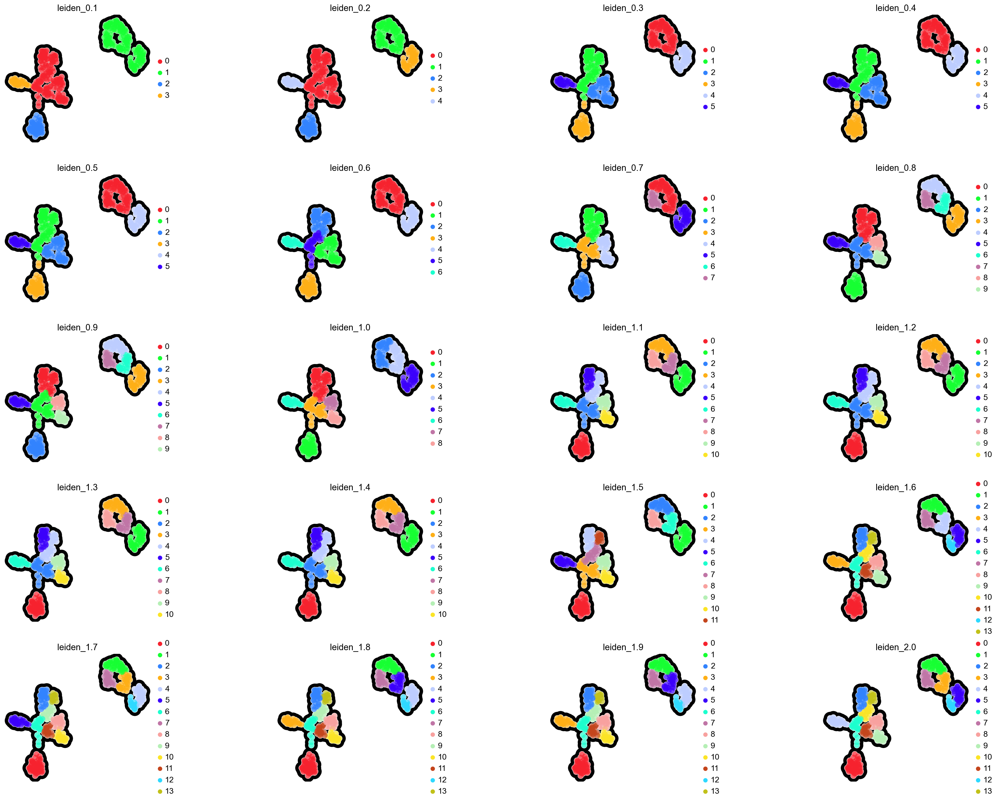

In [21]:
#'leiden_0.1', 'leiden_0.2', 'leiden_0.3','leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0',
#'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'

sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5',
        'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0',
        'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5', 
        'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'
           ], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    #size=35,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [23]:
sc.tl.rank_genes_groups(adata, 
                        groupby='leiden_0.2',  # Change the Leiden clustering
                        method='wilcoxon', 
                        use_raw=False)

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names

df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(150)

df.to_csv(file_outputs + 'myeloid_leiden_0.3.csv', index = False)

df.head(35)

,0_n,1_n,2_n,3_n,4_n
0,Ms4a4c,Tbc1d4,Ppt1,Txndc17,Blnk
1,Ms4a6c,Adgrg6,Xcr1,Mab21l3,Siglech
2,Ms4a6b,Socs2,Naaa,Bcl2l14,Cyb561a3
3,Ms4a6d,Fabp5,Plbd1,Agap1,Tcf4
4,Ifitm3,Samsn1,Rab7b,Arhgap31,Tex2
5,Ctss,Snhg15,Mctp1,Il15ra,Ighm
6,Slfn2,Cd63,Wdfy4,Pfkfb3,Lair1
7,Lilrb4a,Ccr7,Clec9a,Ncoa7,Lifr
8,Fcer1g,Tmem123,Itgae,Cbfa2t3,Carmil1
9,Wfdc17,Fscn1,Tlr3,Laptm4b,Nucb2


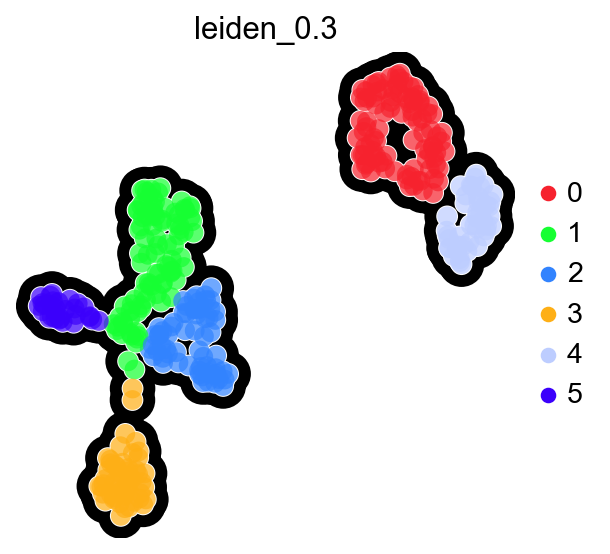

In [25]:
#'leiden_0.1', 'leiden_0.2', 'leiden_0.3','leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0',
#'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'

sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'leiden_0.3',
           ], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    #size=35,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [26]:
cell_type_groups = {
    'DC:cDC1': ['3'],
    'DC:cDC2': ['1', '2'],
    'DC:pDC': ['5'],
    'DC:aDC':['0', '4'],
    #'Monocyte': ['1', '2'], 
    #'Macrophage':['4', '14']

}

cluster_to_cell_type = {cluster: cell_type for cell_type, clusters in cell_type_groups.items() for cluster in clusters}

In [27]:
adata.obs['cell_type_subset'] = adata.obs['leiden_0.3'].map(cluster_to_cell_type) #Add Leiden Cluster

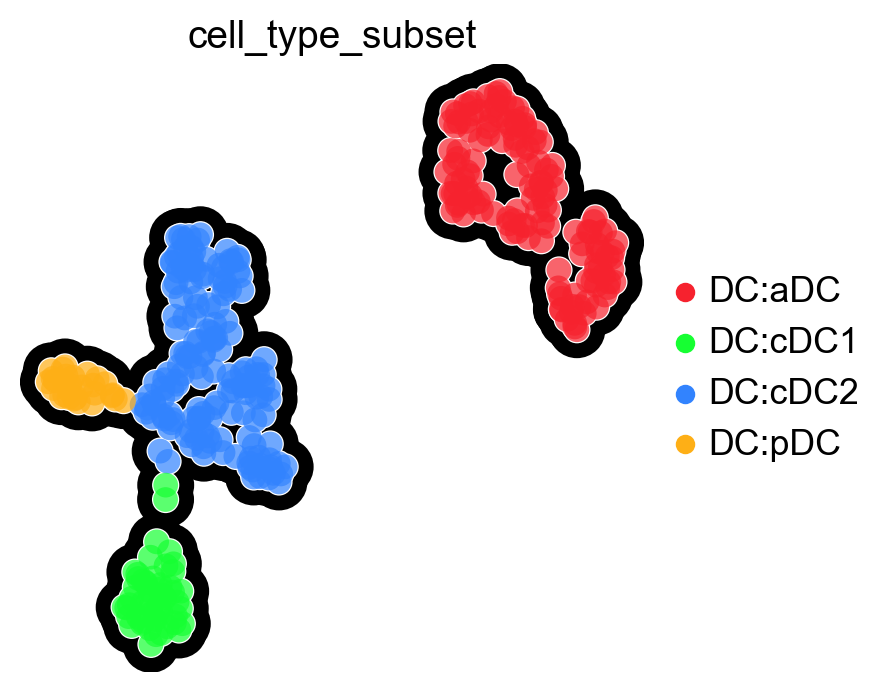

In [28]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'cell_type_subset',
          ],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False, 
)

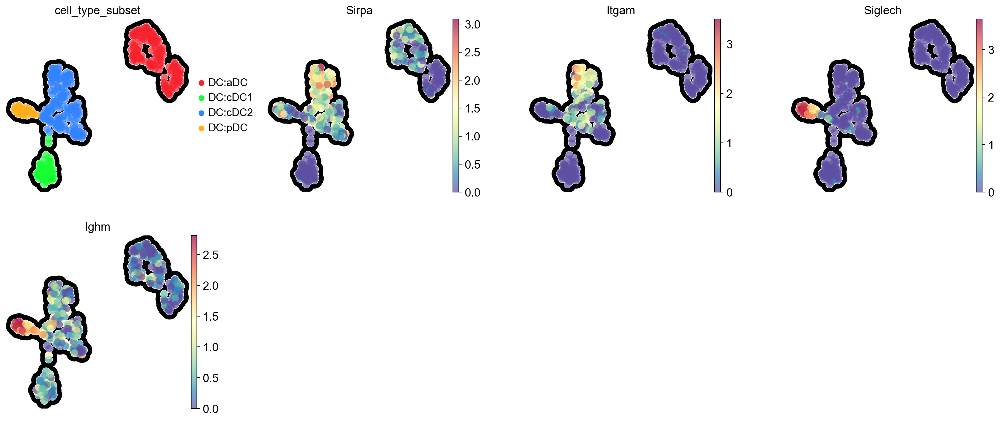

In [11]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'cell_type_subset', 'Sirpa', "Itgam", "Siglech", 'Ighm'
          ],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False, 
)

In [7]:
sc.tl.rank_genes_groups(adata,
groupby='cell_type_subset', 
method='wilcoxon', 
use_raw=False)

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(150) #'scores', 'logfoldchanges', 'pvals_adj'

# df.to_csv(file_outputs + '0_umbrella_gene_rank.csv', index = False)
df.head(50)


,DC:aDC_n,DC:cDC1_n,DC:cDC2_n,DC:pDC_n
0,Cacnb3,Xcr1,Ms4a4c,Blnk
1,Adcy6,Ppt1,Ms4a6c,Siglech
2,Fscn1,Naaa,Ms4a6b,Cyb561a3
3,Strip2,Plbd1,Ms4a6d,Tcf4
4,Mreg,Rab7b,Ifitm3,Tex2
5,Tmem123,Wdfy4,Ctss,Ighm
6,Tbc1d4,Mctp1,Lilrb4a,Lair1
7,Samsn1,Itgae,Slfn2,Lifr
8,Cd63,Clec9a,Fcer1g,Carmil1
9,Ccr7,Tlr3,Fgr,Nucb2


In [29]:
adata.write_h5ad(h5ad + '8_myeloid.h5ad')